## Filter Visualization

In [1]:
import torch
import torch.nn as nn
from torch.autograd import Variable
from torchvision import models
from torchvision import transforms, utils

In [2]:
import numpy as np
import scipy.misc
import matplotlib.pyplot as plt
%matplotlib inline
from PIL import Image
import json

In [3]:
def to_grayscale(image):
    image = torch.mean(image, dim=0)
    return image

In [4]:
def normalize(image):
    normalize = transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
    preprocess = transforms.Compose([
        transforms.Resize((224,224)),
        transforms.ToTensor(),
        normalize
    ])
    image = preprocess(image).unsqueeze(0).cuda()
    return image


def predict(image):
    _, index = vgg(image).data[0].max(0)
    return str(index.item())
    
def deprocess(image):
    return image * torch.Tensor([0.229, 0.224, 0.225]).cuda()  + torch.Tensor([0.485, 0.456, 0.406]).cuda()

def load_image(path):
    image = Image.open(path)
    plt.imshow(image)
    plt.title("Image loaded successfully")
    return image

In [35]:
!wget 'https://drive.google.com/uc?id=1rwCEpO-szW8hSpr4SBQnDlL3wrsMCC7o' -O kitten_1.jpg

--2022-09-12 08:33:21--  https://drive.google.com/uc?id=1rwCEpO-szW8hSpr4SBQnDlL3wrsMCC7o
Resolving drive.google.com (drive.google.com)... 74.125.129.100, 74.125.129.139, 74.125.129.113, ...
Connecting to drive.google.com (drive.google.com)|74.125.129.100|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0s-2c-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/qemvtb5htdfuutsaf9o3sistu1q1upiv/1662971550000/16028176750346704704/*/1rwCEpO-szW8hSpr4SBQnDlL3wrsMCC7o?uuid=d35a1257-31ab-4687-944a-9e91fdf82697 [following]
--2022-09-12 08:33:22--  https://doc-0s-2c-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/qemvtb5htdfuutsaf9o3sistu1q1upiv/1662971550000/16028176750346704704/*/1rwCEpO-szW8hSpr4SBQnDlL3wrsMCC7o?uuid=d35a1257-31ab-4687-944a-9e91fdf82697
Resolving doc-0s-2c-docs.googleusercontent.com (doc-0s-2c-docs.googleusercontent.com)... 142.251.6.132, 2607:f8b0:4001:c5a::84
Connecting to doc-0s-

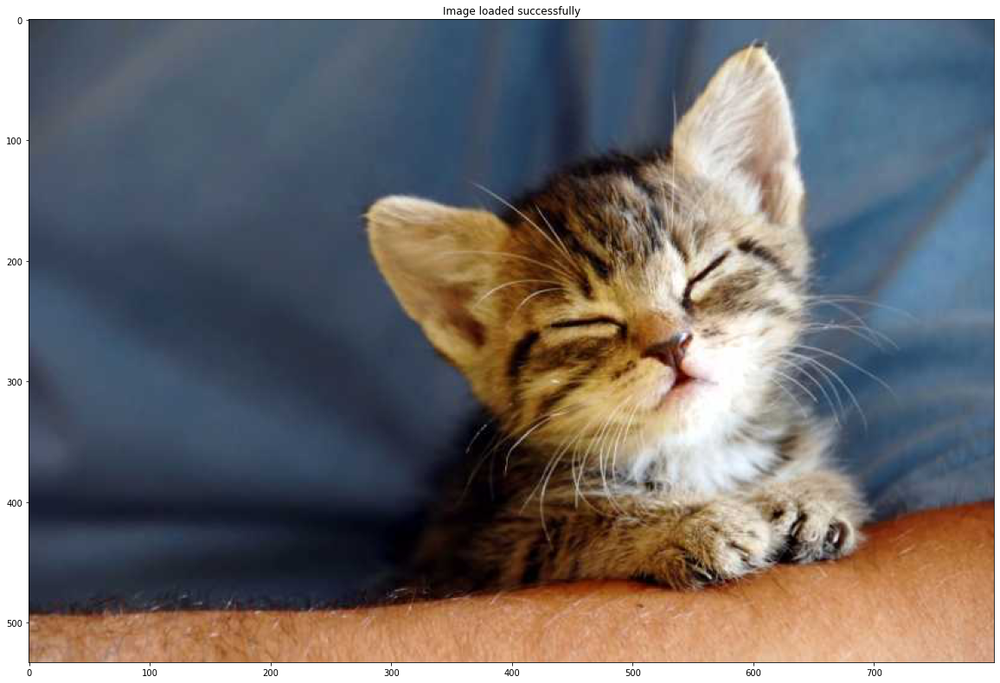

In [36]:
kitten_1 = load_image("kitten_1.jpg")

In [7]:
vgg = models.vgg16(pretrained=True)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

In [8]:
vgg = vgg.cuda()

In [9]:
print(vgg)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [10]:
kitten_2 = normalize(kitten_1)
print(predict(kitten_2))

285


In [11]:
modulelist = list(vgg.features.modules())

In [12]:
modulelist

[Sequential(
   (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (1): ReLU(inplace=True)
   (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (3): ReLU(inplace=True)
   (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
   (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (6): ReLU(inplace=True)
   (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (8): ReLU(inplace=True)
   (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
   (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (11): ReLU(inplace=True)
   (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (13): ReLU(inplace=True)
   (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (15): ReLU(inplace=True)
   (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
   (17): Conv2d(

In [13]:
len(modulelist)

32

In [14]:
from torchsummary import summary

summary(vgg, input_size=(3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

In [15]:
def layer_outputs(image):
    outputs = []
    names = []
    for layer in modulelist[1:]:
        image = layer(image)
        outputs.append(image)
        names.append(str(layer))
        
    output_im = []
    for i in outputs:
        i = i.squeeze(0)
        temp = to_grayscale(i)
        output_im.append(temp.data.cpu().numpy())
        
    fig = plt.figure(figsize=(20,30))


    for i in range(len(output_im)):
        a = fig.add_subplot(8,4,i+1)
        imgplot = plt.imshow(output_im[i], cmap='gray')
        # plt.axis('off')
        a.set_title(names[i].partition('(')[0], fontsize=30)

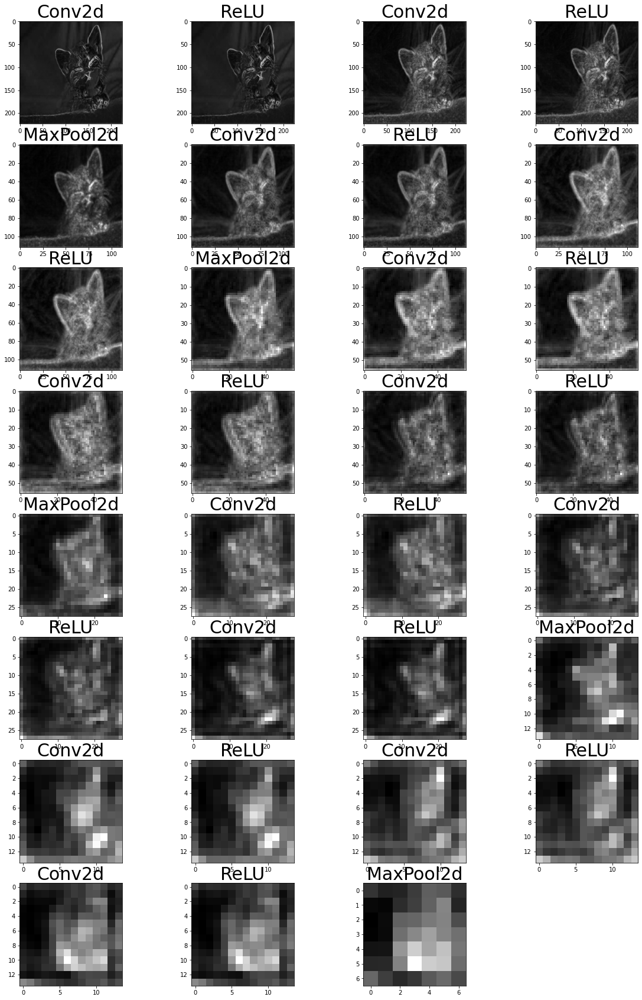

In [16]:
layer_outputs(kitten_2)

In [17]:
def filter_outputs(image, layer_to_visualize):
    if layer_to_visualize < 0:
        layer_to_visualize += 31
    output = None
    name = None
    for count, layer in enumerate(modulelist[1:]):
        image = layer(image)
        if count == layer_to_visualize: 
            output = image
            name = str(layer)
    
    filters = []
    output = output.data.squeeze()
    for i in range(output.shape[0]):
        filters.append(output[i,:,:])
        
    fig = plt.figure(figsize=(20,30))

    print(len(filters), 'filters')
    for i in range(int(np.sqrt(len(filters))) * int(np.sqrt(len(filters)))):
        fig.add_subplot(np.sqrt(len(filters)), np.sqrt(len(filters)),i+1)
        imgplot = plt.imshow(filters[i].cpu(), cmap='gray')
        plt.axis('off')

64 filters


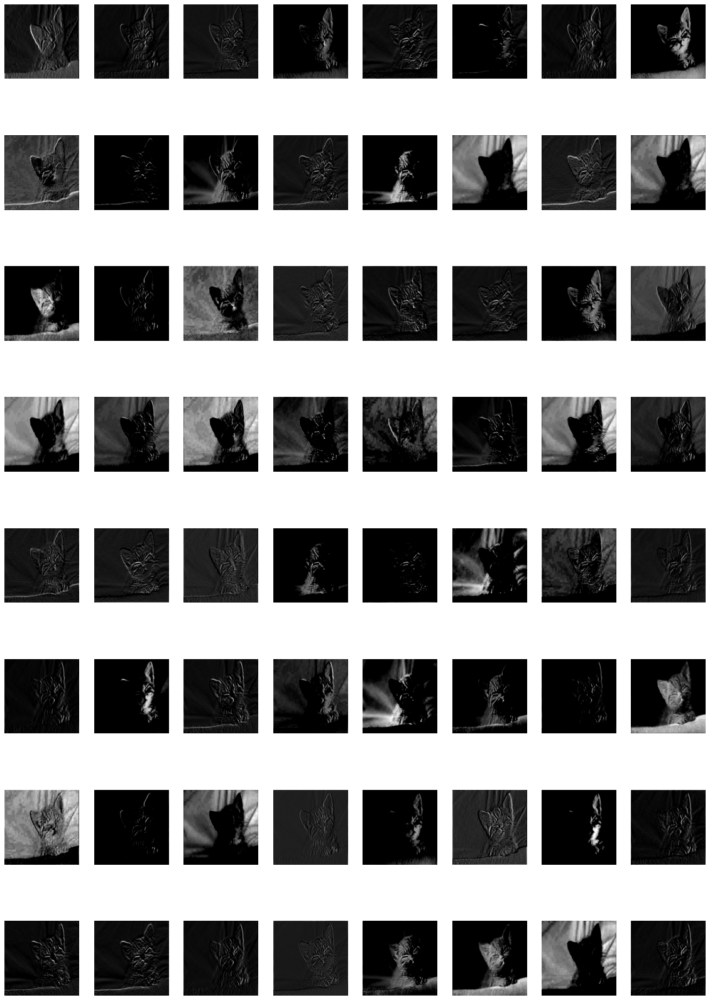

In [18]:
filter_outputs(kitten_2, 0)

512 filters


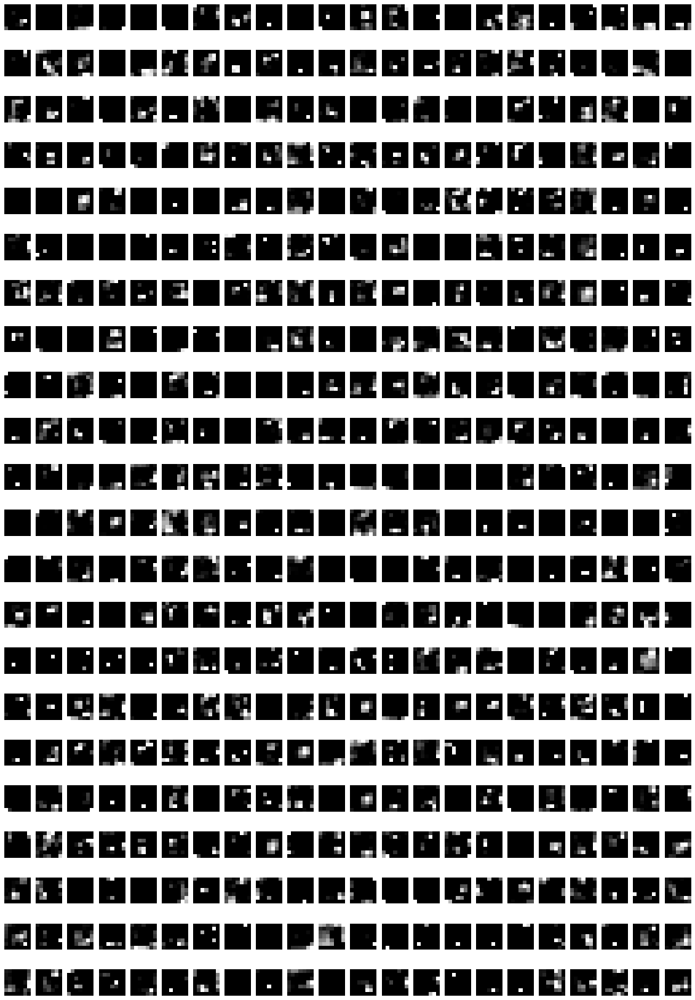

In [19]:
filter_outputs(kitten_2, -1)

In [20]:
def visualize_weights(image, layer):
    weight_used = []
    for w in vgg.features.children():
        if isinstance(w, torch.nn.modules.conv.Conv2d):
            weight_used.append(w.weight.data)

    filters = []
    for i in range(weight_used[layer].shape[0]):
        filters.append(weight_used[layer][i,:,:,:].mean(dim=0))
        
    print(len(filters), 'channels')    
    
    fig = plt.figure()
    plt.rcParams["figure.figsize"] = (20, 30)
    for i in range(int(np.sqrt(weight_used[layer].shape[0])) * int(np.sqrt(weight_used[layer].shape[0]))):
        a = fig.add_subplot(np.sqrt(weight_used[layer].shape[0]),np.sqrt(weight_used[layer].shape[0]),i+1)
        imgplot = plt.imshow(filters[i].cpu(), cmap='gray')
        plt.axis('off')

64 channels


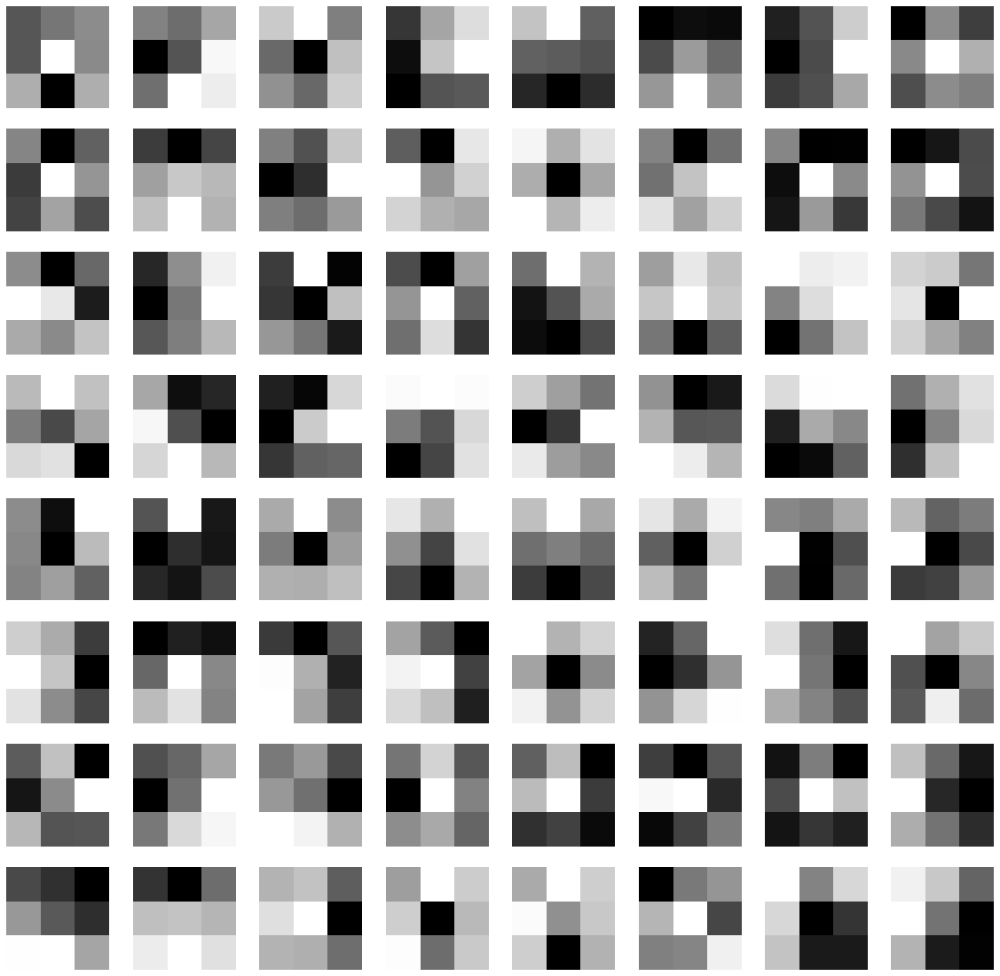

In [37]:
# First conv layer filters
visualize_weights(kitten_2, 0)

512 channels


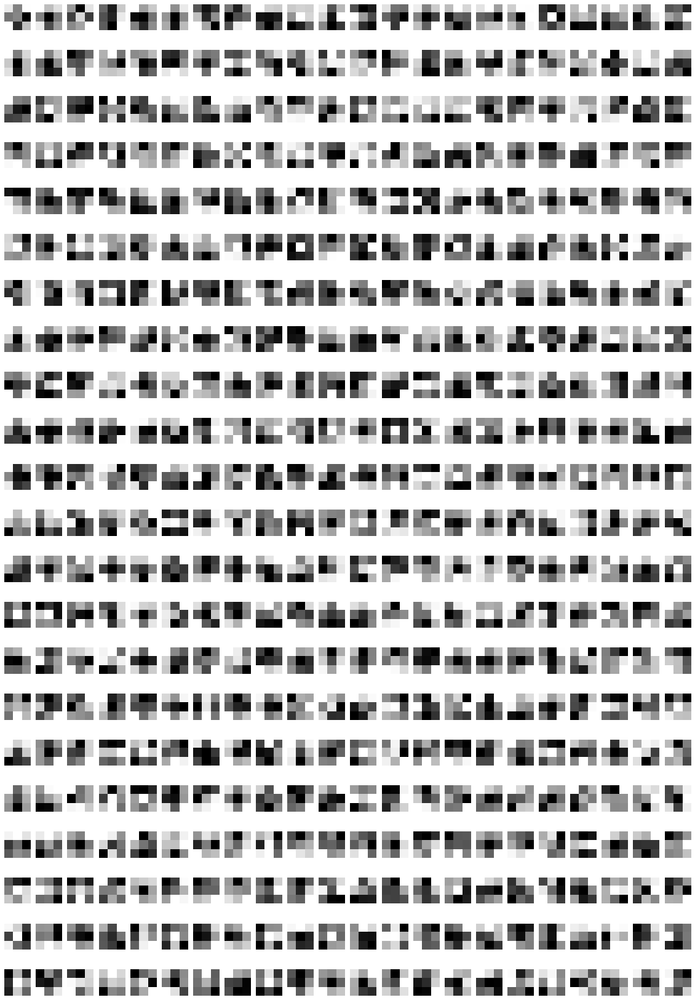

In [22]:
# Last conv layer filters
visualize_weights(kitten_2, -1)

In [23]:
h_filter = torch.ones(kitten_2.shape)
h_filter[:,:,4*32:4*32+64, 4*32:4*32+64] = 0
kitten_2_masked = (kitten_2.cuda() * h_filter.cuda()).cuda()

In [24]:
vgg(kitten_2_masked).data[0].max(0)

torch.return_types.max(
values=tensor(12.8406, device='cuda:0'),
indices=tensor(620, device='cuda:0'))

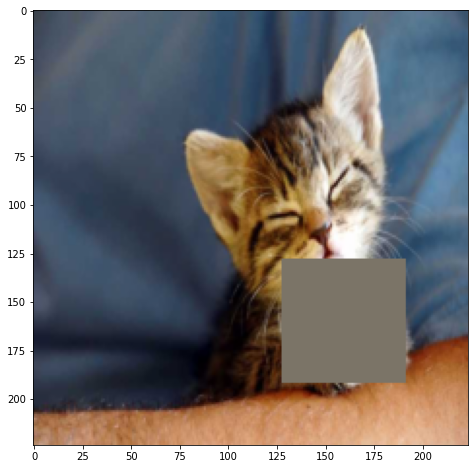

In [25]:
kitten_2_masked = kitten_2_masked.squeeze()
unnormed_kit_masked = kitten_2_masked.transpose(0,1)
unnormed_kit_masked = unnormed_kit_masked.transpose(1,2)
unnormed_kit_masked = unnormed_kit_masked * torch.Tensor([0.229, 0.224, 0.225]).cuda()  + torch.Tensor([0.485, 0.456, 0.406]).cuda()

plt.figure(figsize=(10,8))
plt.imshow(unnormed_kit_masked.cpu());

In [26]:
def make_heatmap(image, true_class, k=64, stride=8): 
    heatmap = torch.zeros(int(((image.shape[2]-k)/stride)+1), int(((image.shape[3]-k)/stride)+1))
    # print(heatmap)
    image = image.data

    i = 0
    a = 0
    while i<=image.shape[3]-k:
        j = 0 
        b = 0
        while j<=image.shape[2]-k:
            h_filter = torch.ones(image.shape)
            h_filter[:,:,j:j+k, i:i+k] = 0
            temp_image = (image.cuda() * h_filter.cuda()).cuda()
            temp_softmax = vgg(temp_image)
            temp_softmax = torch.nn.functional.softmax(temp_softmax).data[0]
            heatmap[a][b] = temp_softmax[true_class]
            j += stride
            b += 1
       
        i += stride
        a += 1
    
    image = image.squeeze()
    
    true_image = image.transpose(0,1)
    true_image = true_image.transpose(1,2)
    # Un-Normalize image
    true_image = true_image * torch.Tensor([0.229, 0.224, 0.225]).cuda()  + torch.Tensor([0.485, 0.456, 0.406]).cuda()
    
    # Plot both images
    fig = plt.figure()
    plt.rcParams["figure.figsize"] = (20, 20)
    
    a = fig.add_subplot(1,2,1)
    imgplot = plt.imshow(true_image.cpu())
    plt.title('Original Image')
    plt.axis('off') 
    
    # Normalize heatmap
    # heatmap = heatmap - heatmap.min()
    # heatmap = np.uint8(255 * heatmap)
    print(heatmap)
    
    a = fig.add_subplot(1,2,2)
    imgplot = plt.imshow(heatmap, cmap='gray')
    plt.title('Heatmap')
    plt.axis('off') 
    
    return heatmap

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  app.launch_new_instance()


tensor([[0.3952, 0.4044, 0.5738, 0.3603, 0.4297, 0.5027],
        [0.6421, 0.5201, 0.3415, 0.3076, 0.5069, 0.6373],
        [0.3152, 0.3956, 0.6341, 0.2907, 0.4284, 0.5126],
        [0.4224, 0.1156, 0.1299, 0.1371, 0.3737, 0.4235],
        [0.4181, 0.1847, 0.2295, 0.0942, 0.0261, 0.4916],
        [0.4595, 0.3068, 0.0955, 0.4711, 0.4122, 0.6448]])


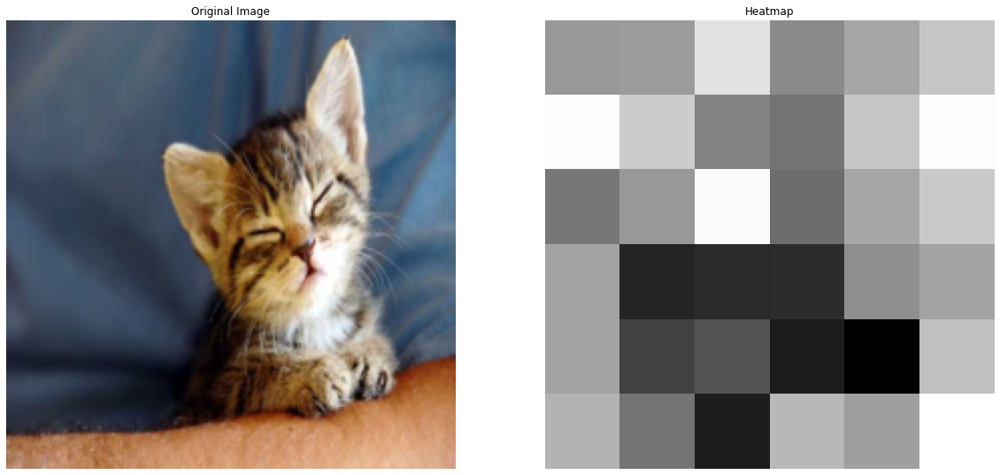

In [27]:
heatmap = make_heatmap(kitten_2, 281, 64, 32)

In [38]:
!wget 'https://drive.google.com/uc?id=1u4oqf8s_5e18T1W1rv-ovFjaJs3-pYqO' -O flamingo.jpg

--2022-09-12 08:33:46--  https://drive.google.com/uc?id=1u4oqf8s_5e18T1W1rv-ovFjaJs3-pYqO
Resolving drive.google.com (drive.google.com)... 74.125.129.138, 74.125.129.102, 74.125.129.139, ...
Connecting to drive.google.com (drive.google.com)|74.125.129.138|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-10-2c-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/6s2s5h4cm63auuorf380nrs0pvahjmus/1662971625000/16028176750346704704/*/1u4oqf8s_5e18T1W1rv-ovFjaJs3-pYqO?uuid=8ec850e9-5e34-4e5c-8d0d-a505528e8309 [following]
--2022-09-12 08:33:46--  https://doc-10-2c-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/6s2s5h4cm63auuorf380nrs0pvahjmus/1662971625000/16028176750346704704/*/1u4oqf8s_5e18T1W1rv-ovFjaJs3-pYqO?uuid=8ec850e9-5e34-4e5c-8d0d-a505528e8309
Resolving doc-10-2c-docs.googleusercontent.com (doc-10-2c-docs.googleusercontent.com)... 142.251.6.132, 2607:f8b0:4001:c5a::84
Connecting to doc-10-

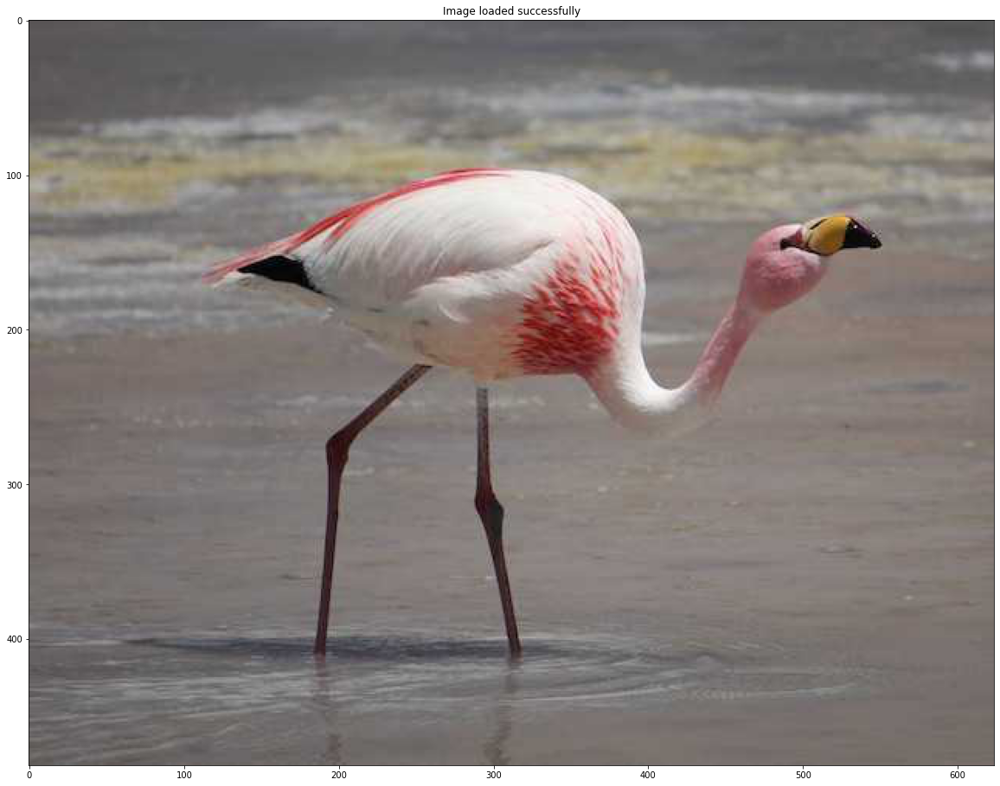

In [39]:
flamingo = normalize(load_image('flamingo.jpg'))

In [40]:
predict(flamingo)

'130'

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  app.launch_new_instance()


tensor([[0.4645, 0.0983, 0.9877, 0.9843, 0.9488, 0.6721],
        [0.6092, 0.8903, 0.9426, 0.9388, 0.7765, 0.8593],
        [0.5225, 0.2940, 0.3512, 0.9819, 0.7020, 0.4316],
        [0.1684, 0.1084, 0.3132, 0.8102, 0.8937, 0.4919],
        [0.2178, 0.5159, 0.5439, 0.5280, 0.9892, 0.8213],
        [0.5590, 0.9453, 0.9214, 0.7781, 0.4896, 0.9182]])


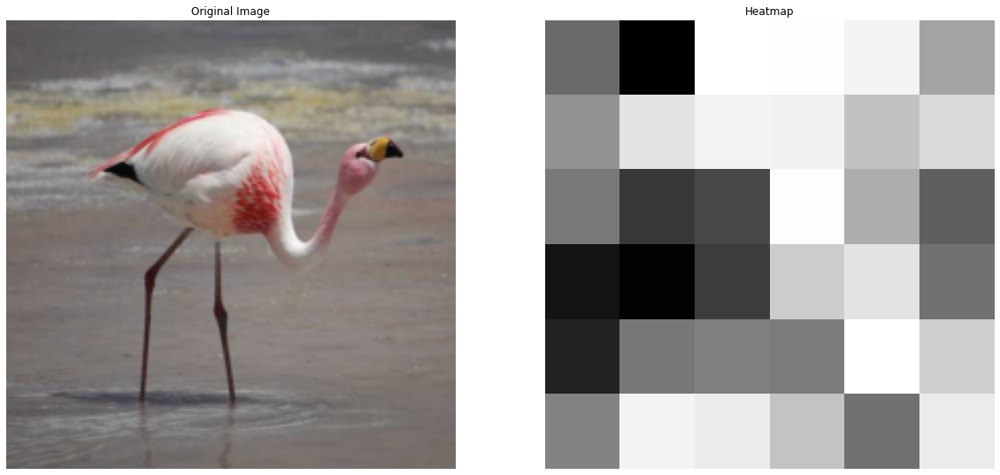

In [41]:
heatmap = make_heatmap(flamingo, 130, 64, 32)

In [42]:
normalise = transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
    )
preprocess = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    normalise
    ])

In [43]:
def make_saliency_map(input, label):
    input = Variable(preprocess(input).unsqueeze(0).cuda(), requires_grad=True)
    output = vgg.forward(input)
    output[0][label].backward()
    # print(output[0][label])

    grads = input.grad.data.clamp(min=0)
    grads.squeeze_()
    grads.transpose_(0,1)
    grads.transpose_(1,2)
    grads = np.amax(grads.cpu().numpy(), axis=2)
    
    true_image = input.data
    true_image = true_image.squeeze()
    true_image = true_image.transpose(0,1)
    true_image = true_image.transpose(1,2)
    true_image = deprocess(true_image)

    fig = plt.figure()
    plt.rcParams["figure.figsize"] = (20, 20)


    a = fig.add_subplot(1,2,1)
    imgplot = plt.imshow(true_image.cpu())
    plt.title('Original Image')
    plt.axis('off')

    a = fig.add_subplot(1,2,2)
    imgplot = plt.imshow(grads)
    plt.axis('off') 
    plt.title('Saliency Map')

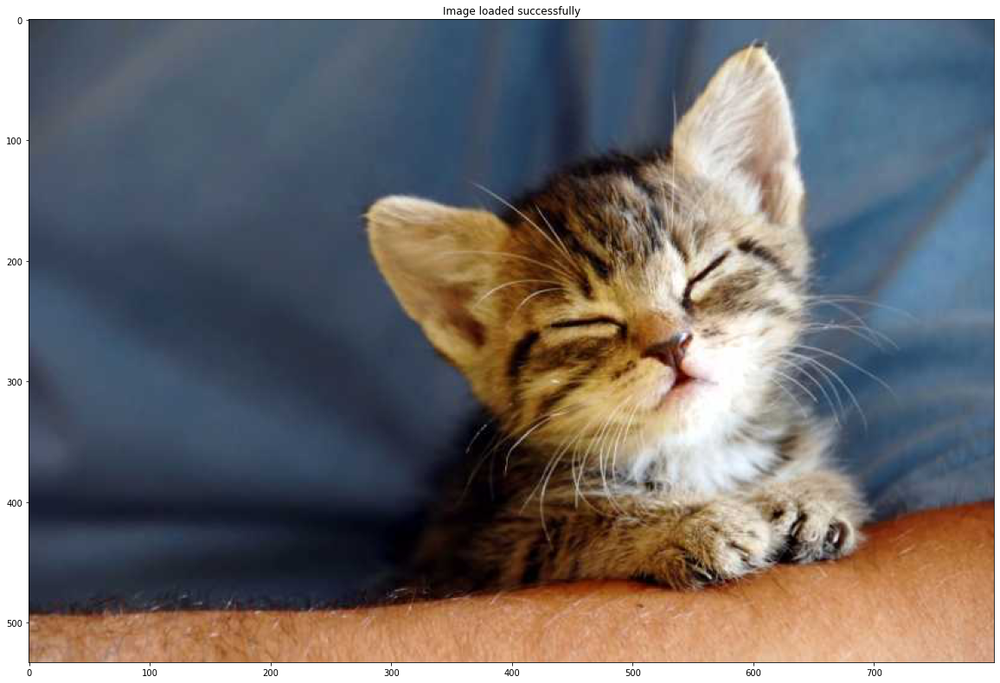

In [44]:
flamingo = load_image('flamingo.jpg')
kitten = load_image('kitten_1.jpg')

In [45]:
predict(normalize(flamingo))

'130'

In [46]:
predict(normalize(kitten))

'285'

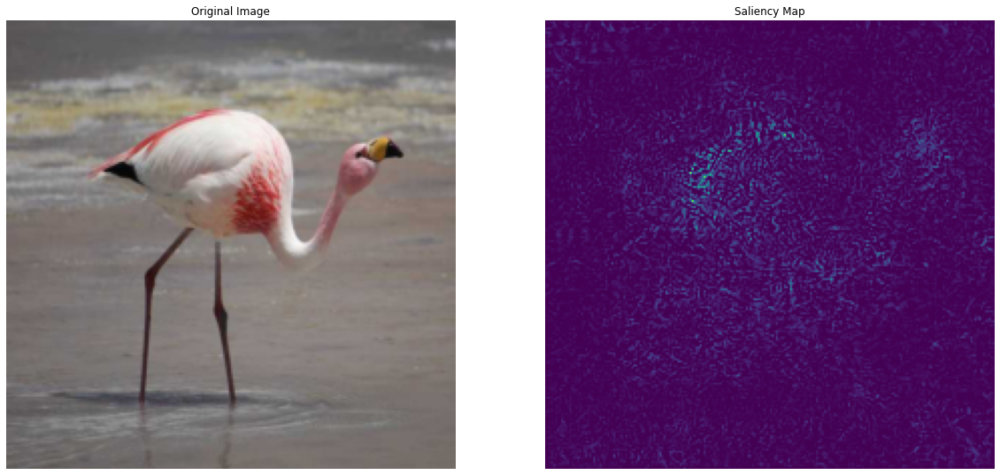

In [47]:
make_saliency_map(flamingo, 130)

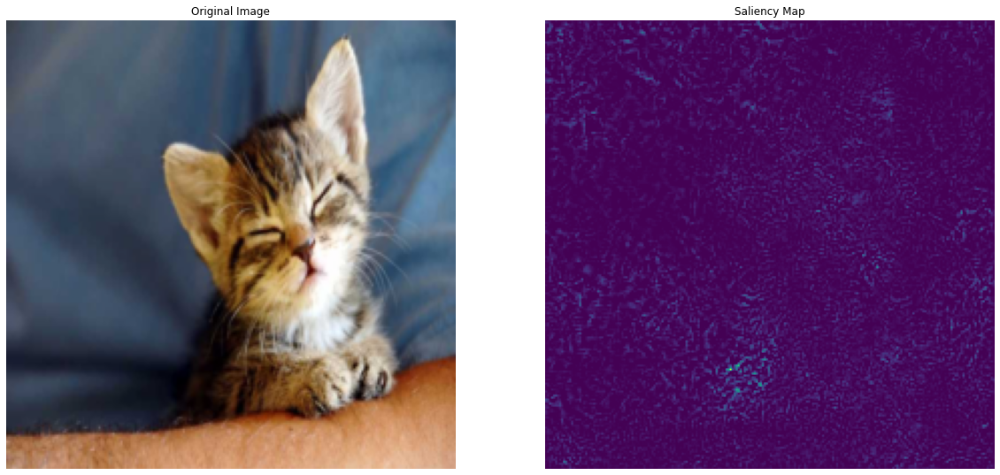

In [48]:
make_saliency_map(kitten, 281)

## Style Transfer

In [49]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
import torchvision.models as models

import copy

In [50]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [51]:
# desired size of the output image
imsize = 512 if torch.cuda.is_available() else 128  # use small size if no gpu

loader = transforms.Compose([
    transforms.Resize(imsize),  # scale imported image
    transforms.ToTensor()])  # transform it into a torch tensor


def image_loader(image_name):
    image = Image.open(image_name)
    # fake batch dimension required to fit network's input dimensions
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)

In [52]:
!wget 'https://drive.google.com/uc?id=1PbKpNG3o-HGY4-zUbvDUnLk4XEPHvYvQ' -O dancing.jpg

--2022-09-12 08:34:17--  https://drive.google.com/uc?id=1PbKpNG3o-HGY4-zUbvDUnLk4XEPHvYvQ
Resolving drive.google.com (drive.google.com)... 74.125.129.102, 74.125.129.101, 74.125.129.113, ...
Connecting to drive.google.com (drive.google.com)|74.125.129.102|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0c-2c-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/50vkctrcms2q3qli2b3oagfb8hoflt3f/1662971625000/16028176750346704704/*/1PbKpNG3o-HGY4-zUbvDUnLk4XEPHvYvQ?uuid=e46b24ed-dd3f-4fc9-a405-5e204d71fbf7 [following]
--2022-09-12 08:34:17--  https://doc-0c-2c-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/50vkctrcms2q3qli2b3oagfb8hoflt3f/1662971625000/16028176750346704704/*/1PbKpNG3o-HGY4-zUbvDUnLk4XEPHvYvQ?uuid=e46b24ed-dd3f-4fc9-a405-5e204d71fbf7
Resolving doc-0c-2c-docs.googleusercontent.com (doc-0c-2c-docs.googleusercontent.com)... 142.251.6.132, 2607:f8b0:4001:c5a::84
Connecting to doc-0c-

In [53]:
!wget 'https://drive.google.com/uc?id=1stNe_9XnPu9-R1EziQSgoWgLCEVJ9YXp' -O picasso.jpg

--2022-09-12 08:34:32--  https://drive.google.com/uc?id=1stNe_9XnPu9-R1EziQSgoWgLCEVJ9YXp
Resolving drive.google.com (drive.google.com)... 74.125.129.102, 74.125.129.101, 74.125.129.113, ...
Connecting to drive.google.com (drive.google.com)|74.125.129.102|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-00-2c-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/m5b0kmhcqndh6ke9fggfssddj2sg2nrn/1662971625000/16028176750346704704/*/1stNe_9XnPu9-R1EziQSgoWgLCEVJ9YXp?uuid=f71356b8-1e7b-41df-b1ae-73fb64ddc6be [following]
--2022-09-12 08:34:33--  https://doc-00-2c-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/m5b0kmhcqndh6ke9fggfssddj2sg2nrn/1662971625000/16028176750346704704/*/1stNe_9XnPu9-R1EziQSgoWgLCEVJ9YXp?uuid=f71356b8-1e7b-41df-b1ae-73fb64ddc6be
Resolving doc-00-2c-docs.googleusercontent.com (doc-00-2c-docs.googleusercontent.com)... 142.251.6.132, 2607:f8b0:4001:c5a::84
Connecting to doc-00-

In [54]:
style_img = image_loader("picasso.jpg")
content_img = image_loader("dancing.jpg")

assert style_img.size() == content_img.size(), \
    "we need to import style and content images of the same size"

In [55]:
unloader = transforms.ToPILImage()  # reconvert into PIL image


def imshow(tensor, title=None):
    image = tensor.cpu().clone()  # we clone the tensor to not do changes on it
    image = image.squeeze(0)      # remove the fake batch dimension
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)

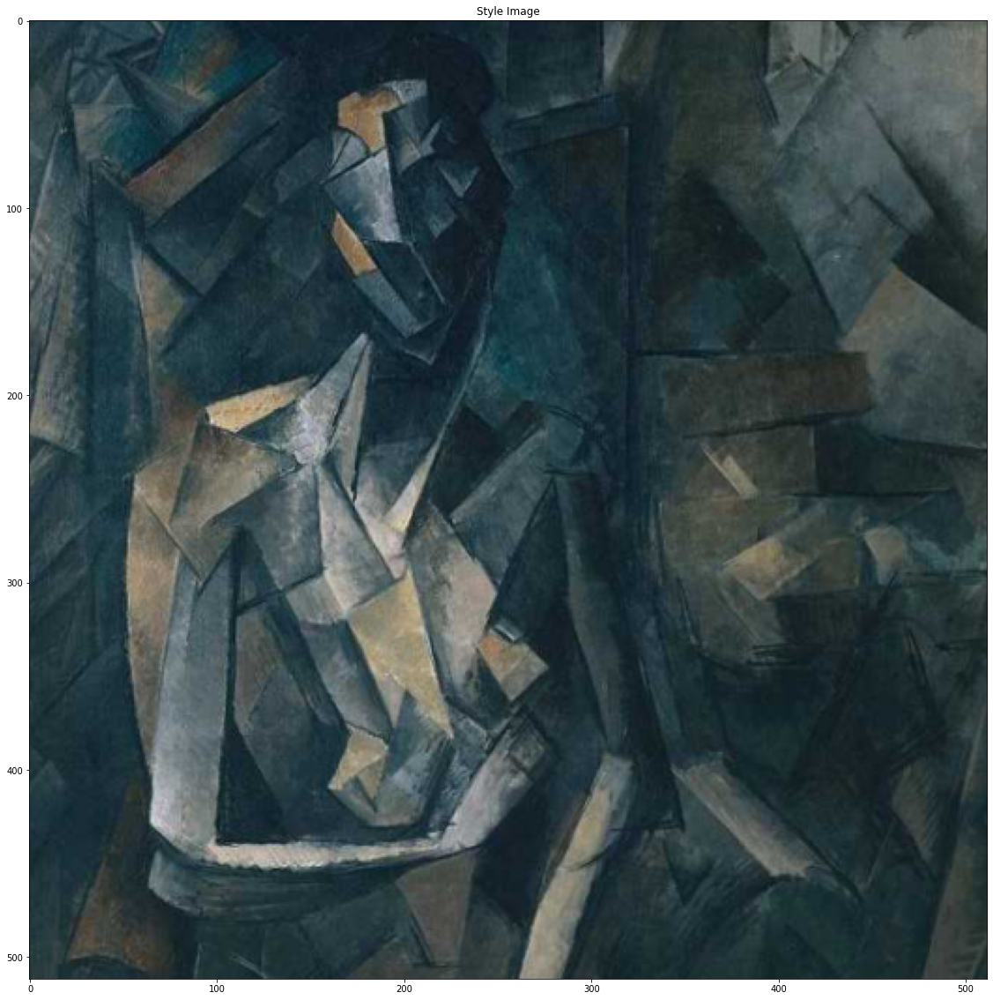

In [56]:
plt.figure()
imshow(style_img, title='Style Image')

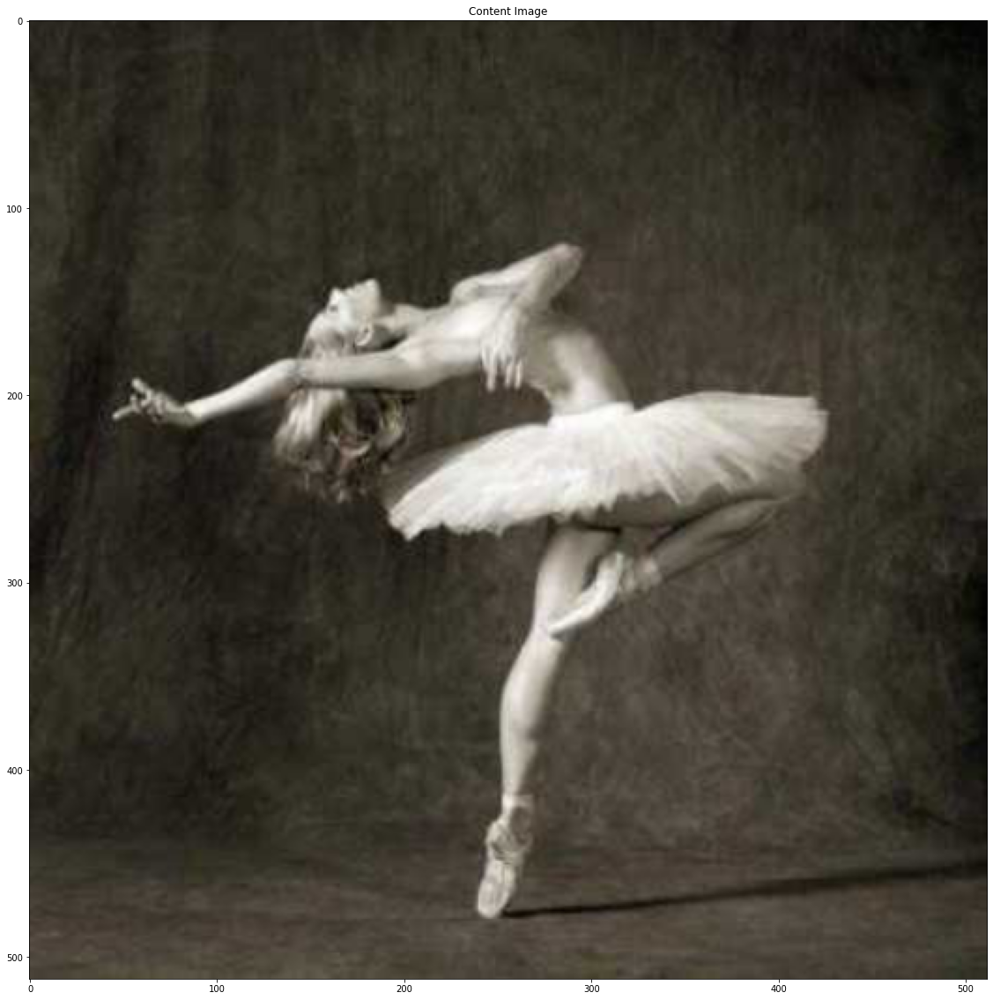

In [57]:
plt.figure()
imshow(content_img, title='Content Image')

In [58]:
class ContentLoss(nn.Module):

    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        # we 'detach' the target content from the tree used
        # to dynamically compute the gradient: this is a stated value,
        # not a variable. Otherwise the forward method of the criterion
        # will throw an error.
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

In [59]:
def gram_matrix(input):
    a, b, c, d = input.size()  # a=batch size(=1)
    # b=number of feature maps
    # (c,d)=dimensions of a f. map (N=c*d)

    features = input.view(a * b, c * d)  # resise F_XL into \hat F_XL

    G = torch.mm(features, features.t())  # compute the gram product

    # we 'normalize' the values of the gram matrix
    # by dividing by the number of element in each feature maps.
    return G.div(a * b * c * d)

In [60]:
class StyleLoss(nn.Module):

    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

In [61]:
cnn = models.vgg19(pretrained=True).features.to(device).eval()

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

In [62]:
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

# create a module to normalize input image so we can easily put it in a
# nn.Sequential
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        # .view the mean and std to make them [C x 1 x 1] so that they can
        # directly work with image Tensor of shape [B x C x H x W].
        # B is batch size. C is number of channels. H is height and W is width.
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        # normalize img
        return (img - self.mean) / self.std

In [63]:
# desired depth layers to compute style/content losses :
content_layers_default = ['conv_1']
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, content_img,
                               content_layers=content_layers_default,
                               style_layers=style_layers_default):
    cnn = copy.deepcopy(cnn)

    # normalization module
    normalization = Normalization(normalization_mean, normalization_std).to(device)

    # just in order to have an iterable access to or list of content/syle
    # losses
    content_losses = []
    style_losses = []

    # assuming that cnn is a nn.Sequential, so we make a new nn.Sequential
    # to put in modules that are supposed to be activated sequentially
    model = nn.Sequential(normalization)

    i = 0  # increment every time we see a conv
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            # The in-place version doesn't play very nicely with the ContentLoss
            # and StyleLoss we insert below. So we replace with out-of-place
            # ones here.
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            # add content loss:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            # add style loss:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    # now we trim off the layers after the last content and style losses
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses

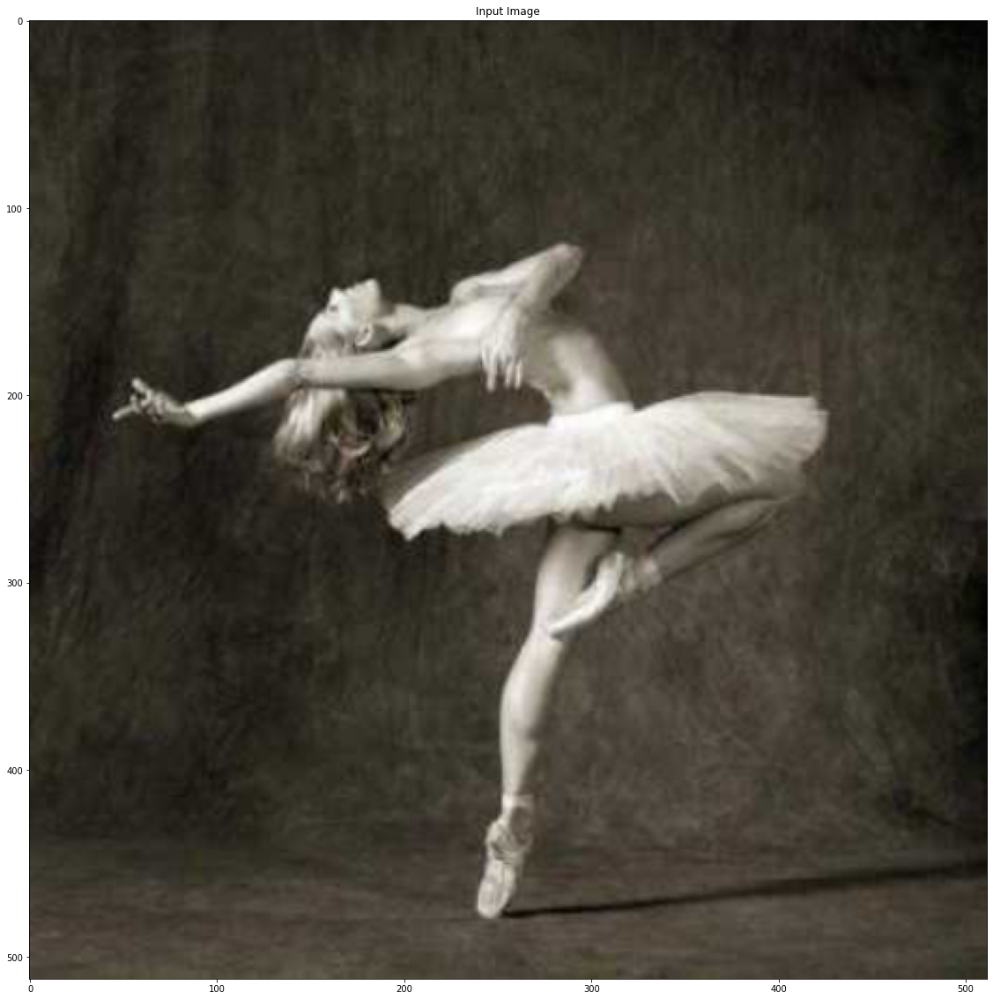

In [64]:
input_img = content_img.clone()
# if you want to use white noise instead uncomment the below line:
# input_img = torch.randn(content_img.data.size(), device=device)

# add the original input image to the figure:
plt.figure()
imshow(input_img, title='Input Image')

In [65]:
def get_input_optimizer(input_img):
    # this line to show that input is a parameter that requires a gradient
    optimizer = optim.LBFGS([input_img.requires_grad_()])
    return optimizer

In [66]:
def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=300,
                       style_weight=1000000, content_weight=1):
    """Run the style transfer."""
    print('Building the style transfer model..')
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_img, content_img)
    optimizer = get_input_optimizer(input_img)

    print('Optimizing..')
    run = [0]
    while run[0] <= num_steps:

        def closure():
            # correct the values of updated input image
            input_img.data.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print("run {}:".format(run))
                print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                    style_score.item(), content_score.item()))
                print()

            return style_score + content_score

        optimizer.step(closure)

    # a last correction...
    input_img.data.clamp_(0, 1)

    return input_img

Building the style transfer model..
Optimizing..


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  del sys.path[0]


run [50]:
Style Loss : 4.477344 Content Loss: 0.081988

run [100]:
Style Loss : 0.959956 Content Loss: 0.087449

run [150]:
Style Loss : 0.528219 Content Loss: 0.092039

run [200]:
Style Loss : 0.300913 Content Loss: 0.097378

run [250]:
Style Loss : 0.186996 Content Loss: 0.101926

run [300]:
Style Loss : 0.112895 Content Loss: 0.105894



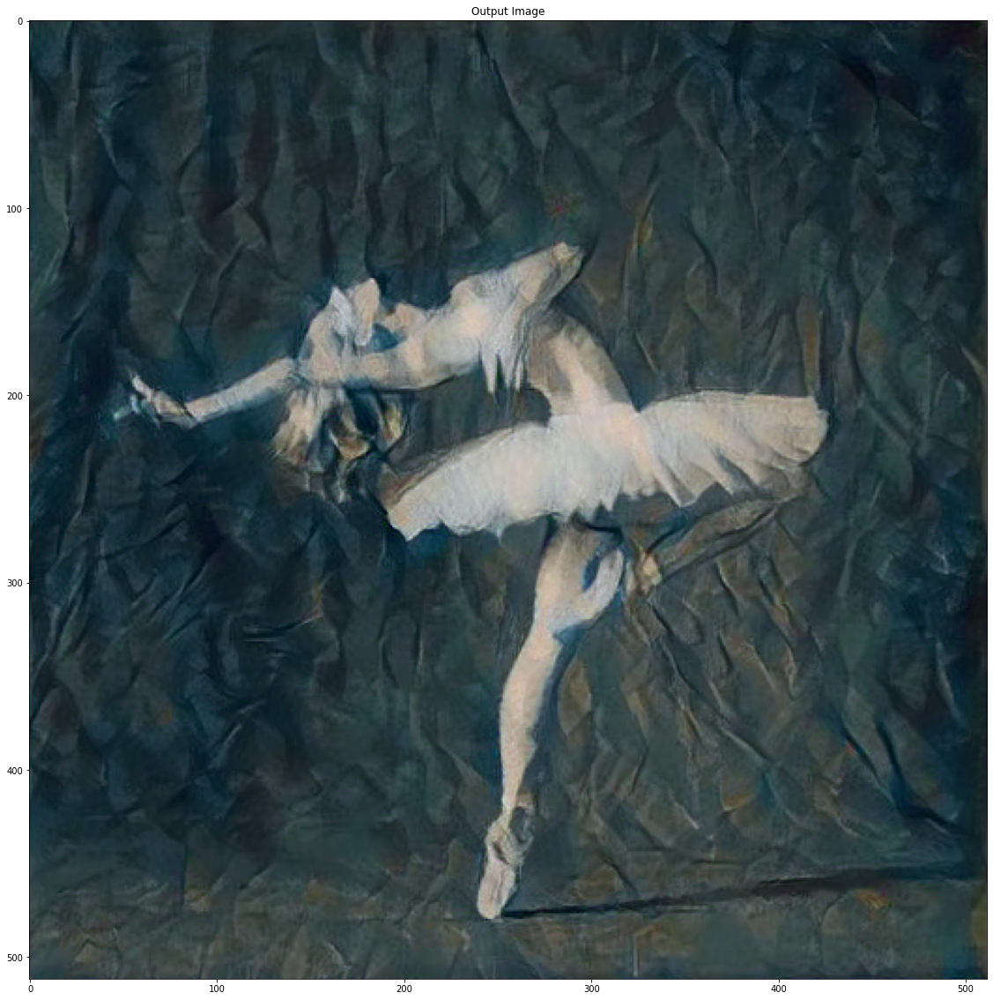

In [67]:
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img,  style_weight=1000000, content_weight=1)

plt.figure()
imshow(output, title='Output Image')

plt.show()

## **Дополнительные материалы**
1. https://github.com/sar-gupta/convisualize_nb/blob/master/cnn-visualize.ipynb
2. https://pytorch.org/tutorials/advanced/neural_style_tutorial.html